# Data Setting

In [2]:
import os
import gc
import time

import numpy as np
import pandas as pd
import statsmodels.api as sm

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from cachetools import cached, LRUCache

import warnings
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')

In [68]:
# Import
train = pd.read_csv("../data/train.csv")
test = pd.read_csv("../data//test.csv")
stores = pd.read_csv("../data//stores.csv")
transactions = pd.read_csv("../data//transactions.csv").sort_values(["store_nbr", "date"])
holidays_events = pd.read_csv("../data//holidays_events.csv")
#sub = pd.read_csv("../input/store-sales-time-series-forecasting/sample_submission.csv")   

In [69]:
train['date'] = pd.to_datetime(train['date'])
test['date'] = pd.to_datetime(test['date'])
transactions['date'] = pd.to_datetime(transactions['date'])
holidays_events['date'] = pd.to_datetime(holidays_events['date'])

# Preprocessing

### train preprocessing

In [17]:
train.describe()

,id,date,store_nbr,sales,onpromotion
count,3000888.00,3000888,3000888.00,3000888.00,3000888.00
mean,1500443.50,2015-04-24 08:27:04.703088384,27.50,357.78,2.60
min,0.00,2013-01-01 00:00:00,1.00,0.00,0.00
25%,750221.75,2014-02-26 18:00:00,14.00,0.00,0.00
50%,1500443.50,2015-04-24 12:00:00,27.50,11.00,0.00
75%,2250665.25,2016-06-19 06:00:00,41.00,195.85,0.00
max,3000887.00,2017-08-15 00:00:00,54.00,124717.00,741.00
std,866281.89,NaN,15.59,1102.00,12.22


In [18]:
train["date"] = pd.to_datetime(train.date)
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,1,2013-01-01,1,BABY CARE,0.00,0
2,2,2013-01-01,1,BEAUTY,0.00,0
3,3,2013-01-01,1,BEVERAGES,0.00,0
4,4,2013-01-01,1,BOOKS,0.00,0


In [19]:
min_date = train['date'].min()
max_date = train['date'].max()

# 전체 기간 생성 및 비어 있는 날짜 찾기
all_dates = pd.date_range(start=min_date, end=max_date)
missing_dates = all_dates.difference(pd.to_datetime(train['date'].unique()))

print("Start Date:", min_date)
print("End Date:", max_date)
print("Missing Dates:", missing_dates)

Start Date: 2013-01-01 00:00:00
End Date: 2017-08-15 00:00:00
Missing Dates: DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25'], dtype='datetime64[ns]', freq=None)


In [20]:
# 결측치 개수 확인

missing_sales = train['sales'].isnull().sum()
missing_onpromotion = train['onpromotion'].isnull().sum()
missing_store_nbr = train['store_nbr'].isnull().sum()
missing_family = train['family'].isnull().sum()

print("Missing sales:", missing_sales)
print("Missing onpromotion:", missing_onpromotion)
print("Missing store_nbr:", missing_store_nbr)
print("Missing family:", missing_family)


Missing sales: 0
Missing onpromotion: 0
Missing store_nbr: 0
Missing family: 0


In [79]:
train['weekday'] = train['date'].dt.dayofweek + 1 # 1: 월요일, 7:일요일

train['year'] = train['date'].dt.year
train['month'] = train['date'].dt.month
train['day'] = train['date'].dt.day


In [80]:
train = train[train['sales'] != 0.0]

In [88]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1196773 entries, 564 to 3000885
Data columns (total 10 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   id           1196773 non-null  int64         
 1   date         1196773 non-null  datetime64[ns]
 2   store_nbr    1196773 non-null  int64         
 3   family       1196773 non-null  object        
 4   sales        1196773 non-null  float64       
 5   onpromotion  1196773 non-null  int64         
 6   weekday      1196773 non-null  int64         
 7   year         1196773 non-null  int32         
 8   month        1196773 non-null  int32         
 9   day          1196773 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(3), int64(4), object(1)
memory usage: 86.7+ MB


In [78]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
564,564,2013-01-01,25,BEVERAGES,810.00,0
566,566,2013-01-01,25,BREAD/BAKERY,180.59,0
568,568,2013-01-01,25,CLEANING,186.00,0
569,569,2013-01-01,25,DAIRY,143.00,0
570,570,2013-01-01,25,DELI,71.09,0


#### 프로모션이 가장 많이 이뤄진 매장 찾기

In [16]:
promotions = train[train['onpromotion'] != 0.00][['date', 'store_nbr']].drop_duplicates()

print(promotions)

              date  store_nbr
810784  2014-04-01          9
812571  2014-04-02          9
814346  2014-04-03          9
816130  2014-04-04          9
817908  2014-04-05          9
...            ...        ...
3000726 2017-08-15         54
3000758 2017-08-15          6
3000791 2017-08-15          7
3000824 2017-08-15          8
3000857 2017-08-15          9

[59203 rows x 2 columns]


In [17]:
# onpromotion 합계가 가장 많은 date 찾기
max_promotion_date = train.groupby('date')['onpromotion'].sum().idxmax()
max_promotion_date

Timestamp('2016-12-07 00:00:00')

In [18]:
# store_nbr별 onpromotion 합계 계산
store_promotion_sums = train.groupby('store_nbr')['onpromotion'].sum()

# onpromotion 합계가 가장 많은 store_nbr 찾기
max_promotion_store = store_promotion_sums.idxmax()

print(f'프로모션을 가장 많이 한 store_nbr: {max_promotion_store}')

프로모션을 가장 많이 한 store_nbr: 53


In [19]:
# store_nbr이 53인 데이터만 추출
df_store_53 = train[train['store_nbr'] == 53]

# 날짜별 sales의 합계 계산
df_store_53_sales = df_store_53.groupby('date')['sales'].sum().reset_index()

# 결과 출력
df_store_53_sales

,date,sales
0,2013-01-01,0.00
1,2013-01-02,0.00
2,2013-01-03,0.00
3,2013-01-04,0.00
4,2013-01-05,0.00
...,...,...
1679,2017-08-11,12033.41
1680,2017-08-12,12316.16
1681,2017-08-13,12750.18
1682,2017-08-14,8530.74


##### 프로모션이 많이 이뤄진 요일 찾기

In [82]:
# onpromotion이 가장 많이 이루어진 요일 찾기
promotion_by_weekday = train.groupby('weekday')['onpromotion'].sum()
max_promotion_weekday = promotion_by_weekday.idxmax()

print(f"onpromotion이 가장 많이 이루어진 요일: {max_promotion_weekday} (1=Monday, 7=Sunday)")

onpromotion이 가장 많이 이루어진 요일: 3 (1=Monday, 7=Sunday)


### train EDA

##### 판매량과 판매 제품을 알기위해 특정 스토어에서 EDA

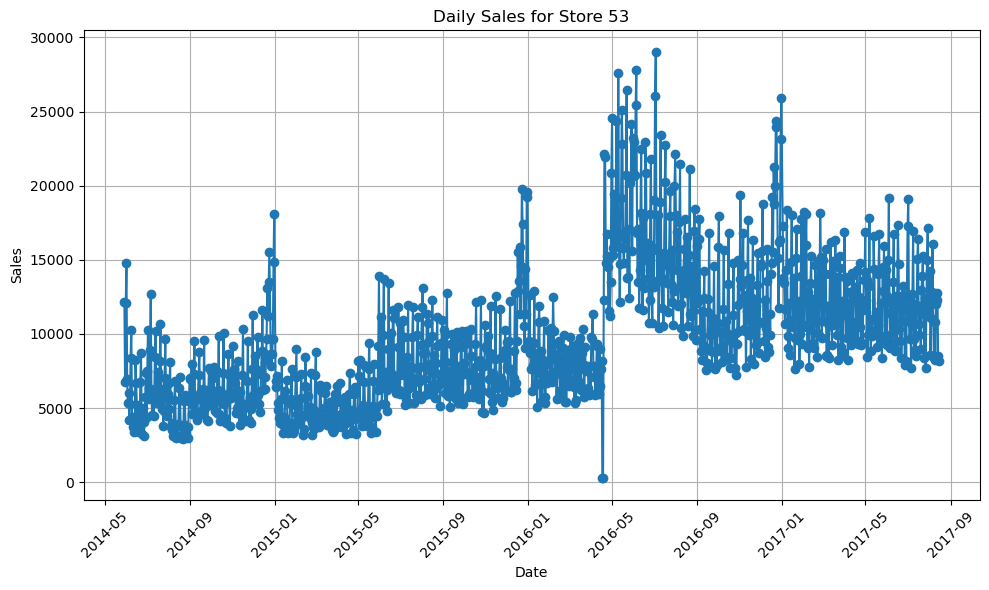

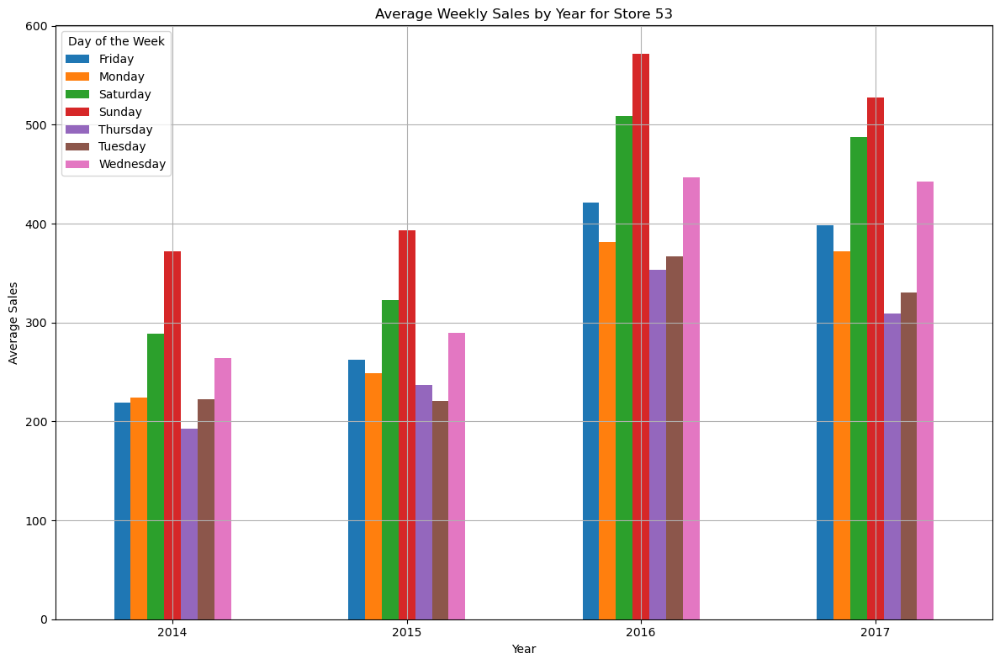

In [20]:
# store_nbr이 53인 데이터만 추출
df_store_53 = train[train['store_nbr'] == 53]
df_store_53 = df_store_53[df_store_53['sales'] != 0]

# 날짜별 sales의 합계 계산
date_sales_sum = df_store_53.groupby('date')['sales'].sum().reset_index()

# Line chart for sales over time
plt.figure(figsize=(10, 6))
plt.plot(date_sales_sum['date'], date_sales_sum['sales'], marker='o')
plt.title('Daily Sales for Store 53')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# 요일별 sales의 양을 연도별로 평균
df_store_53['date'] = pd.to_datetime(df_store_53['date'])
df_store_53['weekday'] = df_store_53['date'].dt.day_name()
df_store_53['year'] = df_store_53['date'].dt.year

weekday_sales_mean = df_store_53.groupby(['year', 'weekday'])['sales'].mean().unstack()

# Bar chart for average weekly sales by year
weekday_sales_mean.plot(kind='bar', figsize=(12, 8))
plt.title('Average Weekly Sales by Year for Store 53')
plt.xlabel('Year')
plt.ylabel('Average Sales')
plt.xticks(rotation=0)
plt.legend(title='Day of the Week')
plt.grid(True)
plt.tight_layout()
plt.show()

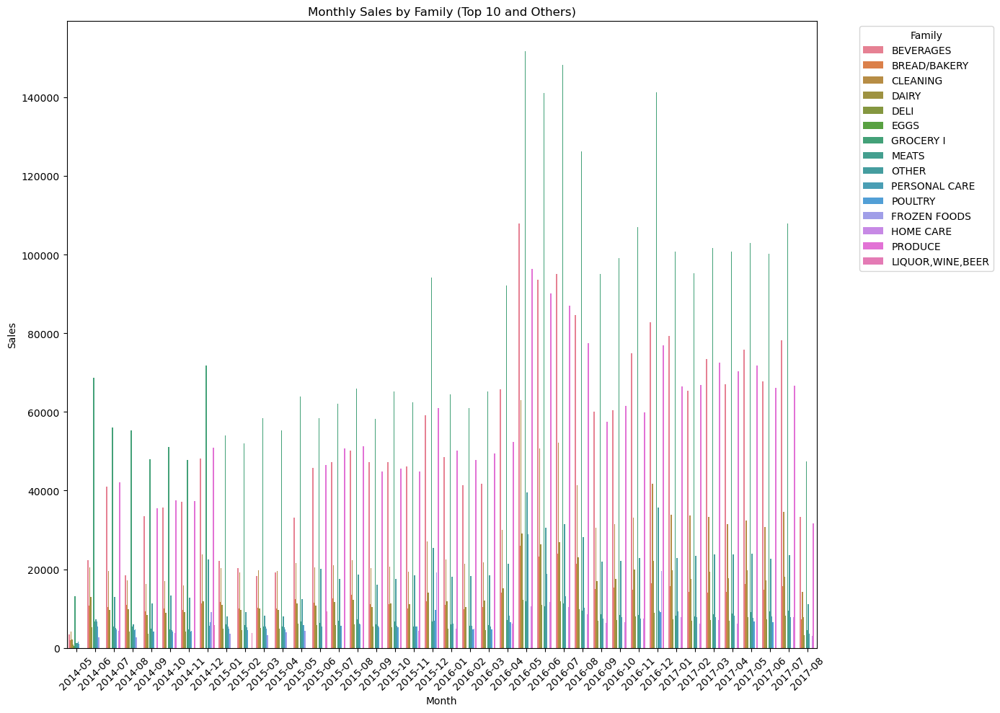

In [21]:
# store_nbr이 53인 데이터만 추출
df_store_53 = train[train['store_nbr'] == 53]

# sales가 0인 데이터 제거
df_store_53 = df_store_53[df_store_53['sales'] != 0]

# 월별로 변환
df_store_53['month'] = df_store_53['date'].dt.to_period('M')

# 월별 family 별 sales 합계 계산
monthly_sales = df_store_53.groupby(['month', 'family'])['sales'].sum().reset_index()

# 각 월별로 상위 10개 family와 나머지 그룹핑
def categorize_family(group):
    top_families = group.nlargest(10, 'sales')['family']
    group['family'] = group['family'].apply(lambda x: x if x in top_families.values else 'OTHER')
    return group

monthly_sales_grouped = monthly_sales.groupby('month', group_keys=False).apply(categorize_family)

# 그룹화된 데이터로 월별 family 별 sales 합계 재계산
monthly_sales_grouped = monthly_sales_grouped.groupby(['month', 'family'])['sales'].sum().reset_index()

# 막대그래프 그리기
plt.figure(figsize=(14, 10))
sns.barplot(data=monthly_sales_grouped, x='month', y='sales', hue='family')
plt.title('Monthly Sales by Family (Top 10 and Others)')
plt.xlabel('Month')
plt.ylabel('Sales')
plt.xticks(rotation=45)
plt.legend(title='Family', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

##### 전체 매장의 상품(Family) 확인하기

In [22]:
a = train.set_index("date").groupby("family").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "family", title = "Daily total sales of the family")

In [23]:
a = train.groupby("family").sales.mean().sort_values(ascending = False).reset_index()
px.bar(a, y = "family", x="sales", color = "family", title = "Which product family preferred more?")

In [74]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1196773 entries, 564 to 3000885
Data columns (total 6 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   id           1196773 non-null  int64         
 1   date         1196773 non-null  datetime64[ns]
 2   store_nbr    1196773 non-null  int64         
 3   family       1196773 non-null  object        
 4   sales        1196773 non-null  float64       
 5   onpromotion  1196773 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 63.9+ MB


##### 프로모션이 있는 날과 없는 날을 요일을 기반으로 비교 EDA

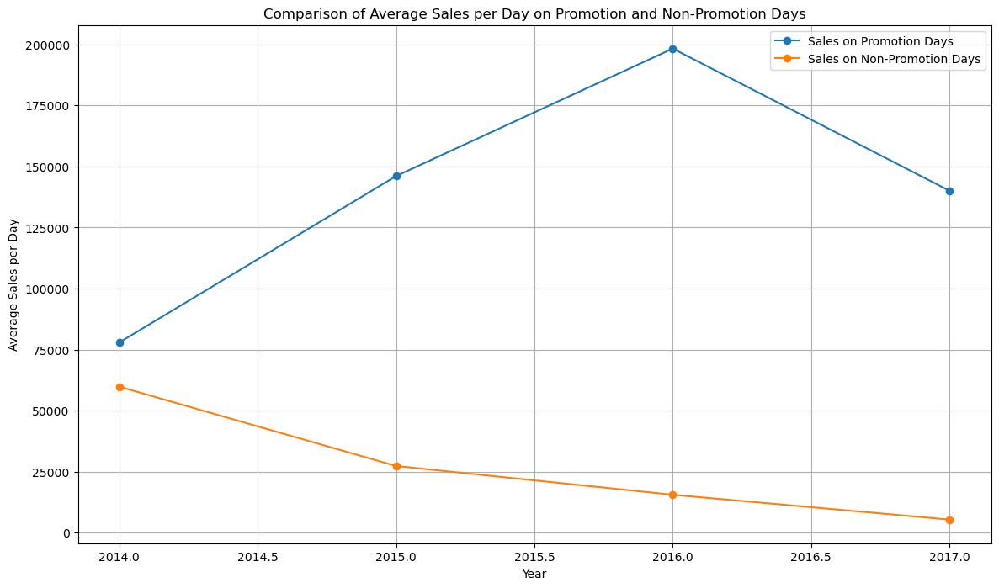

In [29]:
# 프로모션이 있는 요일과 없는 요일 데이터 분리
promotion_days = train[(train['weekday'] == max_promotion_weekday) & (train['onpromotion'] > 0)]
non_promotion_days = train[(train['weekday'] == max_promotion_weekday) & (train['onpromotion'] == 0)]

# 각 요일에 대한 연간 데이터 비교
annual_promotion_summary = promotion_days.groupby(['year', 'weekday'])['sales'].sum().reset_index()
annual_non_promotion_summary = non_promotion_days.groupby(['year', 'weekday'])['sales'].sum().reset_index()

# 데이터 합치기
comparison_df = pd.merge(annual_promotion_summary, annual_non_promotion_summary, on=['year', 'weekday'], suffixes=('_promotion', '_non_promotion'))

# 1일당 매출 계산
comparison_df['sales_per_day_promotion'] = comparison_df['sales_promotion'] / promotion_days['date'].nunique()
comparison_df['sales_per_day_non_promotion'] = comparison_df['sales_non_promotion'] / non_promotion_days['date'].nunique()

# 그래프 그리기
plt.figure(figsize=(14, 8))
plt.plot(comparison_df['year'], comparison_df['sales_per_day_promotion'], label='Sales on Promotion Days', marker='o')
plt.plot(comparison_df['year'], comparison_df['sales_per_day_non_promotion'], label='Sales on Non-Promotion Days', marker='o')
plt.xlabel('Year')
plt.ylabel('Average Sales per Day')
plt.title('Comparison of Average Sales per Day on Promotion and Non-Promotion Days')
plt.legend()
plt.grid(True)
plt.show()

In [39]:
# Feature Selection - 모델 기반 방법
# 1. Random Forest Feature Importance
X = train_encoded.drop(columns=['sales', 'date'])
y = train_encoded['sales']
rf_model = RandomForestRegressor()
rf_model.fit(X, y)
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

print("Feature ranking:")
for f in range(X.shape[1]):
    print(f"{f + 1}. feature {X.columns[indices[f]]} ({importances[indices[f]]})")



Feature ranking:
1. feature store_nbr (0.3027555803758986)
2. feature family_GROCERY I (0.30101062571797227)
3. feature family_BEVERAGES (0.11743193485847024)
4. feature id (0.0633844066024864)
5. feature onpromotion (0.05526876086948523)
6. feature weekday (0.04386748345794245)
7. feature family_PRODUCE (0.03515407816699295)
8. feature family_CLEANING (0.02229848874540309)
9. feature day (0.01717809329106261)
10. feature month (0.016594402715985973)
11. feature family_Others (0.012686812205085442)
12. feature family_DAIRY (0.005046194683653599)
13. feature family_BREAD/BAKERY (0.0017614401694007506)
14. feature year (0.0014100600104302013)
15. feature family_MEATS (0.0012249982268808567)
16. feature family_POULTRY (0.0011318902902995578)
17. feature family_FROZEN FOODS (0.0005854975226007062)
18. feature family_LIQUOR,WINE,BEER (0.00025018657178780076)
19. feature family_HOME CARE (0.00022551783593319455)
20. feature family_PERSONAL CARE (0.00022203210422788808)
21. feature family_DEL

In [87]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1196773 entries, 564 to 3000885
Data columns (total 10 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   id           1196773 non-null  int64         
 1   date         1196773 non-null  datetime64[ns]
 2   store_nbr    1196773 non-null  int64         
 3   family       1196773 non-null  object        
 4   sales        1196773 non-null  float64       
 5   onpromotion  1196773 non-null  int64         
 6   weekday      1196773 non-null  int64         
 7   year         1196773 non-null  int32         
 8   month        1196773 non-null  int32         
 9   day          1196773 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(3), int64(4), object(1)
memory usage: 86.7+ MB


In [89]:
# family 컬럼 처리: 상위 15개 상품군을 제외한 나머지는 'Others'로 변경
family_sales_mean = train.groupby('family')['sales'].mean().sort_values(ascending=False).reset_index()
top_15_families = family_sales_mean.head(15)['family']
train['family'] = train['family'].apply(lambda x: x if x in top_15_families.values else 'Others')

# 상위 15개 상품군만 남김
train = train[train['family'].isin(top_15_families)]

In [92]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1196773 entries, 564 to 3000885
Data columns (total 10 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   id           1196773 non-null  int64         
 1   date         1196773 non-null  datetime64[ns]
 2   store_nbr    1196773 non-null  int64         
 3   family       1196773 non-null  object        
 4   sales        1196773 non-null  float64       
 5   onpromotion  1196773 non-null  int64         
 6   weekday      1196773 non-null  int64         
 7   year         1196773 non-null  int32         
 8   month        1196773 non-null  int32         
 9   day          1196773 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(3), int64(4), object(1)
memory usage: 86.7+ MB


In [94]:
# 피벗 테이블 생성
train_pivot_family = train.pivot_table(index=['date', 'store_nbr', 'weekday', 'year', 'month', 'day'], 
                             columns='family', 
                             values=['sales', 'onpromotion'],
                             fill_value=0)

# 컬럼 이름을 단순화
train_pivot_family.columns = ['{}_{}'.format(col[1], col[0]) for col in train_pivot_family.columns]

sales_columns = [col for col in train_pivot_family.columns if col.endswith('_sales')]

# _sales 컬럼들의 값을 합산하여 total_sales 컬럼 추가
train_pivot_family['_sales'] = train_pivot_family[sales_columns].sum(axis=1)
# 인덱스를 리셋하여 데이터프레임으로 변환
train_pivot_family.reset_index(inplace=True)


In [95]:
train_pivot_family.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83606 entries, 0 to 83605
Data columns (total 37 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          83606 non-null  datetime64[ns]
 1   store_nbr                     83606 non-null  int64         
 2   weekday                       83606 non-null  int64         
 3   year                          83606 non-null  int32         
 4   month                         83606 non-null  int32         
 5   day                           83606 non-null  int32         
 6   BEVERAGES_onpromotion         83606 non-null  float64       
 7   BREAD/BAKERY_onpromotion      83606 non-null  float64       
 8   CLEANING_onpromotion          83606 non-null  float64       
 9   DAIRY_onpromotion             83606 non-null  float64       
 10  DELI_onpromotion              83606 non-null  float64       
 11  EGGS_onpromotion            

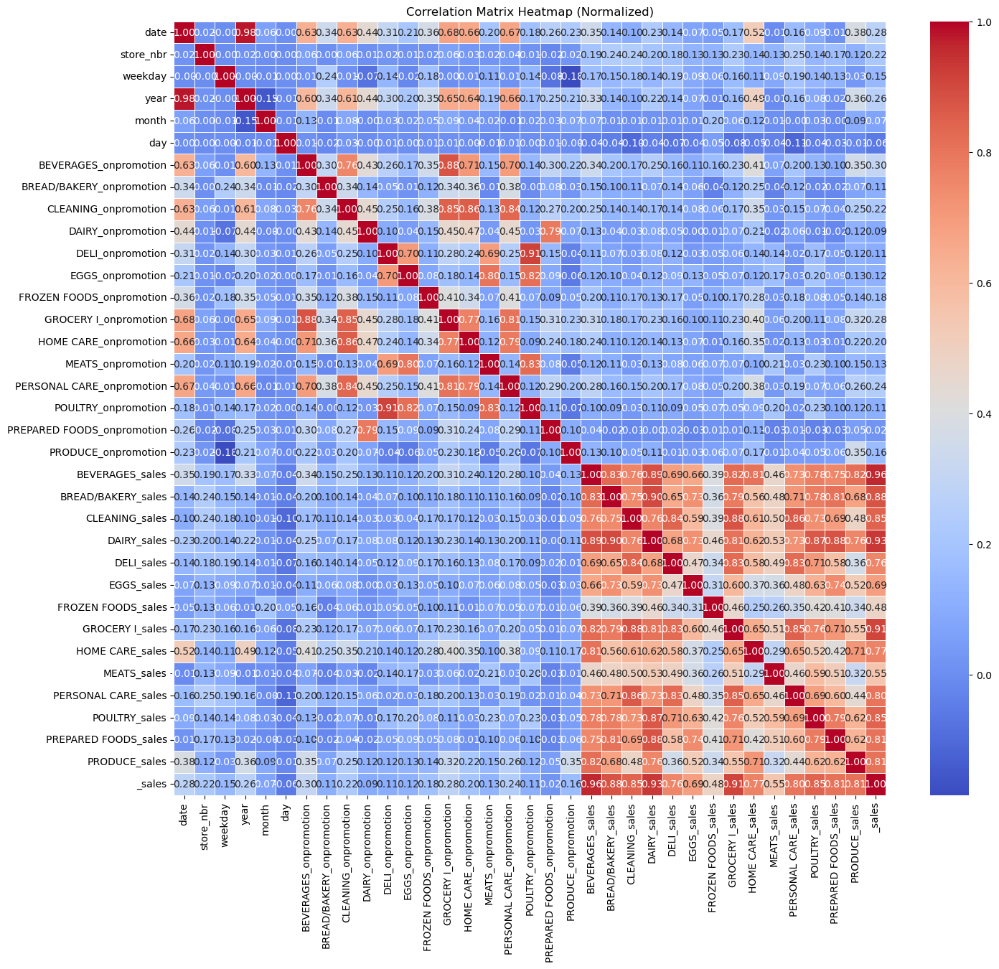

Correlation with sales:
                             BEVERAGES_sales  BREAD/BAKERY_sales  \
BEVERAGES_sales                        1.00                0.83   
_sales                                 0.96                0.88   
DAIRY_sales                            0.89                0.90   
BREAD/BAKERY_sales                     0.83                1.00   
GROCERY I_sales                        0.82                0.79   
PRODUCE_sales                          0.82                0.68   
HOME CARE_sales                        0.81                0.56   
POULTRY_sales                          0.78                0.78   
CLEANING_sales                         0.76                0.75   
PREPARED FOODS_sales                   0.75                0.81   
PERSONAL CARE_sales                    0.73                0.71   
DELI_sales                             0.69                0.65   
EGGS_sales                             0.66                0.73   
MEATS_sales                          

In [40]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.linear_model import LassoCV

# 정규화를 위해 수치형 데이터 추출
sales_columns = [col for col in train_pivot_family.columns if '_sales' in col]
onpromotion_columns = [col for col in train_pivot_family.columns if '_onpromotion' in col]
numeric_features = sales_columns + onpromotion_columns

# StandardScaler를 사용하여 데이터 정규화
scaler = StandardScaler()
train_pivot_family[numeric_features] = scaler.fit_transform(train_pivot_family[numeric_features])

# 모든 feature와 sales 간의 상관관계 계산
correlation_matrix = train_pivot_family.corr()

# 히트맵 그리기
plt.figure(figsize=(16, 14))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap (Normalized)')
plt.show()

# Feature Selection - 상관관계 기반 선택
sales_correlation = correlation_matrix[sales_columns].sort_values(by=sales_columns, ascending=False)
print("Correlation with sales:\n", sales_correlation)


In [41]:
# Feature Selection - 모델 기반 방법
# 1. Random Forest Feature Importance
X = train_pivot_family.drop(columns=['_sales', 'date'])
y = train_pivot_family['_sales']
rf_model = RandomForestRegressor()
rf_model.fit(X, y)
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

print("Feature ranking:")
for f in range(X.shape[1]):
    print(f"{f + 1}. feature {X.columns[indices[f]]} ({importances[indices[f]]})")

Feature ranking:
1. feature BEVERAGES_sales (0.8685016929555044)
2. feature GROCERY I_sales (0.06578884793506279)
3. feature DAIRY_sales (0.046192343357047555)
4. feature PRODUCE_sales (0.01009161285133767)
5. feature MEATS_sales (0.001959668231120935)
6. feature POULTRY_sales (0.0017990302513362715)
7. feature CLEANING_sales (0.001698759992693251)
8. feature FROZEN FOODS_sales (0.0010465927170768628)
9. feature HOME CARE_sales (0.00035869057132804585)
10. feature PERSONAL CARE_sales (0.00034008077496163624)
11. feature BREAD/BAKERY_sales (0.00032530614078567617)
12. feature DELI_sales (0.00029605024339698265)
13. feature EGGS_sales (0.00024162754522112737)
14. feature PREPARED FOODS_sales (0.00022455849178109805)
15. feature store_nbr (0.00015949818112417878)
16. feature day (0.00011817660757979)
17. feature PRODUCE_onpromotion (8.694138414727387e-05)
18. feature BREAD/BAKERY_onpromotion (8.510401333322064e-05)
19. feature BEVERAGES_onpromotion (7.304932078589174e-05)
20. feature GROC

Lasso selected features: Index(['store_nbr', 'BEVERAGES_sales', 'BREAD/BAKERY_sales', 'CLEANING_sales',
       'DAIRY_sales', 'DELI_sales', 'EGGS_sales', 'FROZEN FOODS_sales',
       'GROCERY I_sales', 'HOME CARE_sales', 'MEATS_sales',
       'PERSONAL CARE_sales', 'POULTRY_sales', 'PREPARED FOODS_sales',
       'PRODUCE_sales'],
      dtype='object')


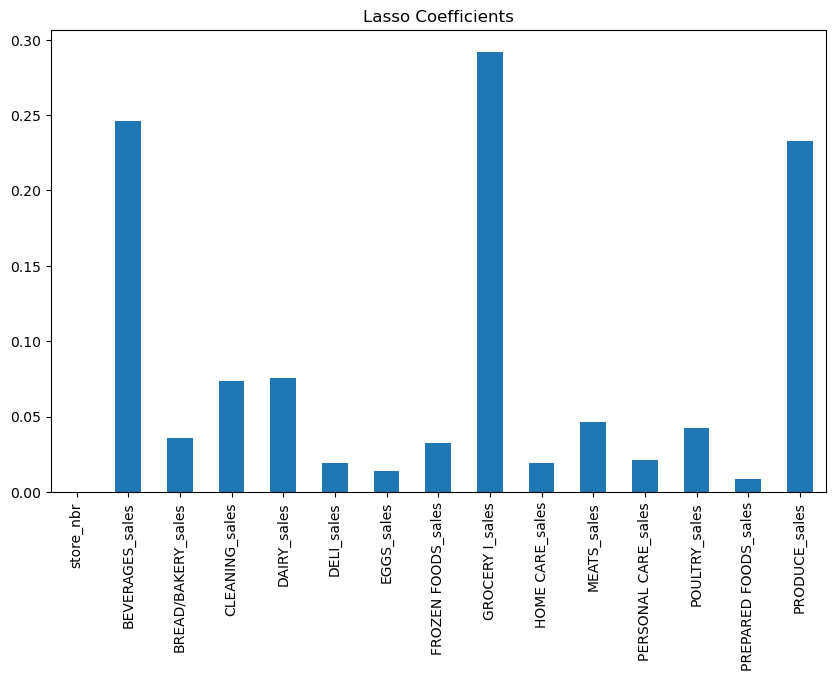

In [43]:

# 3. Lasso Regression
lasso = LassoCV()
lasso.fit(X, y)
lasso_coef = pd.Series(lasso.coef_, index=X.columns)
print("Lasso selected features:", lasso_coef[lasso_coef != 0].index)

# Lasso coefficients visualization
plt.figure(figsize=(10, 6))
lasso_coef[lasso_coef != 0].plot(kind='bar')
plt.title('Lasso Coefficients')
plt.show()

## Transaction Preprocessing

In [96]:
train_pivot_family.head()

,date,store_nbr,weekday,year,month,day,BEVERAGES_onpromotion,BREAD/BAKERY_onpromotion,CLEANING_onpromotion,DAIRY_onpromotion,DELI_onpromotion,EGGS_onpromotion,FROZEN FOODS_onpromotion,GROCERY I_onpromotion,HOME CARE_onpromotion,"LIQUOR,WINE,BEER_onpromotion",MEATS_onpromotion,PERSONAL CARE_onpromotion,POULTRY_onpromotion,PREPARED FOODS_onpromotion,PRODUCE_onpromotion,BEVERAGES_sales,BREAD/BAKERY_sales,CLEANING_sales,DAIRY_sales,DELI_sales,EGGS_sales,FROZEN FOODS_sales,GROCERY I_sales,HOME CARE_sales,"LIQUOR,WINE,BEER_sales",MEATS_sales,PERSONAL CARE_sales,POULTRY_sales,PREPARED FOODS_sales,PRODUCE_sales,_sales
0,2013-01-01,25,2,2013,1,1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,810.00,180.59,186.00,143.00,71.09,46.00,29.65,700.00,0.00,105.00,110.80,25.00,42.64,37.85,0.00,2487.62
1,2013-01-02,1,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1091.00,470.65,1060.00,579.00,164.07,246.00,131.00,2652.00,0.00,67.00,369.10,194.00,247.30,47.00,0.00,7318.12
2,2013-01-02,2,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1481.00,523.88,1432.00,651.00,303.88,307.00,111.10,3870.00,0.00,29.00,655.63,333.00,342.51,127.36,0.00,10167.35
3,2013-01-02,3,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4486.00,1361.64,3101.00,1606.00,600.27,814.00,490.39,8463.00,0.00,122.00,945.64,623.00,681.35,428.00,0.00,23722.28
4,2013-01-02,4,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1545.00,422.54,1358.00,589.00,268.34,273.00,146.13,4087.00,0.00,27.00,494.20,387.00,385.81,109.06,0.00,10092.09


In [97]:
transactions["date"] = pd.to_datetime(transactions.date)
transactions.head()

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520


In [98]:
transactions.describe()

,date,store_nbr,transactions
count,83488,83488.00,83488.00
mean,2015-05-20 16:07:40.866232064,26.94,1694.60
min,2013-01-01 00:00:00,1.00,5.00
25%,2014-03-27 00:00:00,13.00,1046.00
50%,2015-06-08 00:00:00,27.00,1393.00
75%,2016-07-14 06:00:00,40.00,2079.00
max,2017-08-15 00:00:00,54.00,8359.00
std,NaN,15.61,963.29


In [99]:
duplicated_dates = transactions[transactions.duplicated(subset='date', keep=False)]

print(duplicated_dates)

            date  store_nbr  transactions
1     2013-01-02          1          2111
47    2013-01-03          1          1833
93    2013-01-04          1          1863
139   2013-01-05          1          1509
185   2013-01-06          1           520
...          ...        ...           ...
83271 2017-08-11         54           768
83325 2017-08-12         54           903
83379 2017-08-13         54          1054
83433 2017-08-14         54           818
83487 2017-08-15         54           802

[83485 rows x 3 columns]


In [100]:
grouped_df = transactions.groupby(['date', 'store_nbr'], as_index=False)['transactions'].sum()

print(grouped_df)

            date  store_nbr  transactions
0     2013-01-01         25           770
1     2013-01-02          1          2111
2     2013-01-02          2          2358
3     2013-01-02          3          3487
4     2013-01-02          4          1922
...          ...        ...           ...
83483 2017-08-15         50          2804
83484 2017-08-15         51          1573
83485 2017-08-15         52          2255
83486 2017-08-15         53           932
83487 2017-08-15         54           802

[83488 rows x 3 columns]


In [101]:
min_date = transactions['date'].min()
max_date = transactions['date'].max()

# 전체 기간 생성 및 비어 있는 날짜 찾기
all_dates = pd.date_range(start=min_date, end=max_date)
missing_dates = all_dates.difference(pd.to_datetime(transactions['date'].unique()))

print("Start Date:", min_date)
print("End Date:", max_date)
print("Missing Dates:", missing_dates)

Start Date: 2013-01-01 00:00:00
End Date: 2017-08-15 00:00:00
Missing Dates: DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-01-01',
               '2016-01-03', '2016-12-25'],
              dtype='datetime64[ns]', freq=None)


## transaction EDA

In [102]:
temp = pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), transactions, how = "left")
temp = temp.dropna(subset=['transactions'])
temp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 83488 entries, 0 to 83605
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   sales         83488 non-null  float64       
 3   transactions  83488 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 3.2 MB


In [103]:
temp.head()

,date,store_nbr,sales,transactions
0,2013-01-01,25,2487.62,770.00
1,2013-01-02,1,7318.12,2111.00
2,2013-01-02,2,10167.35,2358.00
3,2013-01-02,3,23722.28,3487.00
4,2013-01-02,4,10092.09,1922.00


In [104]:
print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(temp.corr("spearman").sales.loc["transactions"]))
px.line(transactions.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )

Spearman Correlation between Total Sales and Transactions: 0.8176


In [105]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
px.box(a, x="year", y="transactions" , color = "month", title = "Transactions")

In [106]:
a = transactions.set_index("date").resample("M").transactions.mean().reset_index()
a["year"] = a.date.dt.year
px.line(a, x='date', y='transactions', color='year',title = "Monthly Average Transactions" )

In [107]:
px.scatter(temp, x = "transactions", y = "sales", trendline = "ols", trendline_color_override = "red")

### 일주일 간의 거래건수 표시

In [108]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1 # monday 0->1
a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
px.line(a, x="dayofweek", y="transactions" , color = "year", title = "Transactions of Week")

In [111]:
train_pivot_family.head()
train_pivot_family.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83606 entries, 0 to 83605
Data columns (total 37 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          83606 non-null  datetime64[ns]
 1   store_nbr                     83606 non-null  int64         
 2   weekday                       83606 non-null  int64         
 3   year                          83606 non-null  int32         
 4   month                         83606 non-null  int32         
 5   day                           83606 non-null  int32         
 6   BEVERAGES_onpromotion         83606 non-null  float64       
 7   BREAD/BAKERY_onpromotion      83606 non-null  float64       
 8   CLEANING_onpromotion          83606 non-null  float64       
 9   DAIRY_onpromotion             83606 non-null  float64       
 10  DELI_onpromotion              83606 non-null  float64       
 11  EGGS_onpromotion            

In [112]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 83488 entries, 1 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   transactions  83488 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 2.5 MB


In [114]:
# 두 데이터셋 병합
train_fa_tr = pd.merge(train_pivot_family, transactions, on=['date', 'store_nbr'], how='left')

# transactions 또는 _sales 값이 누락된 날짜 확인
missing_data = train_fa_tr[(train_fa_tr['transactions'].isnull()) | (train_fa_tr['_sales'].isnull())]

# 누락된 항목이 무엇인지 표시
missing_data['missing'] = missing_data.apply(
    lambda row: 'transactions' if pd.isnull(row['transactions']) else '_sales',
    axis=1
)

# 누락된 날짜와 항목 출력
print("Transactions 또는 _sales 값이 누락된 날짜 및 항목:\n", missing_data[['date', 'store_nbr', 'missing']])

# 결과 확인
print(train_fa_tr.head())

Transactions 또는 _sales 값이 누락된 날짜 및 항목:
             date  store_nbr       missing
7779  2013-06-19         10  transactions
7800  2013-06-19         35  transactions
7807  2013-06-19         43  transactions
7816  2013-06-19         54  transactions
16941 2014-01-02         32  transactions
...          ...        ...           ...
52555 2016-01-04         51  transactions
52556 2016-01-04         53  transactions
52557 2016-01-04         54  transactions
66581 2016-09-27          7  transactions
66596 2016-09-27         23  transactions

[118 rows x 3 columns]
        date  store_nbr  weekday  year  month  day  BEVERAGES_onpromotion  \
0 2013-01-01         25        2  2013      1    1                   0.00   
1 2013-01-02          1        3  2013      1    2                   0.00   
2 2013-01-02          2        3  2013      1    2                   0.00   
3 2013-01-02          3        3  2013      1    2                   0.00   
4 2013-01-02          4        3  2013      1  

In [127]:
train_fa_tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83606 entries, 0 to 83605
Data columns (total 38 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          83606 non-null  datetime64[ns]
 1   store_nbr                     83606 non-null  int64         
 2   weekday                       83606 non-null  int64         
 3   year                          83606 non-null  int32         
 4   month                         83606 non-null  int32         
 5   day                           83606 non-null  int32         
 6   BEVERAGES_onpromotion         83606 non-null  float64       
 7   BREAD/BAKERY_onpromotion      83606 non-null  float64       
 8   CLEANING_onpromotion          83606 non-null  float64       
 9   DAIRY_onpromotion             83606 non-null  float64       
 10  DELI_onpromotion              83606 non-null  float64       
 11  EGGS_onpromotion            

### Store data preprocessing

In [137]:
stores = pd.read_csv("../data//stores.csv")
#stores["date"] = pd.to_datetime(stores["date"])

stores.head(55)

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


##### store EDA

In [131]:
pip install geopandas folium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 25.0 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.0/100.0 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.9/13.9 MB 38.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 47.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 35.7 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [132]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

In [134]:
# 도시별 위도와 경도 데이터를 추가 (위도, 경도는 예시로 제공됩니다. 실제 위도와 경도로 업데이트 필요)
city_coords = {
    "Quito": {"lat": -0.1807, "lon": -78.4678},
    "Santo Domingo": {"lat": -0.2534, "lon": -79.1700},
    "Cayambe": {"lat": 0.0328, "lon": -78.1455},
    "Latacunga": {"lat": -0.9333, "lon": -78.6167},
    "Riobamba": {"lat": -1.6635, "lon": -78.6546},
    "Ibarra": {"lat": 0.3392, "lon": -78.1223},
    "Guaranda": {"lat": -1.5943, "lon": -79.0016},
    "Puyo": {"lat": -1.4923, "lon": -78.0024},
    "Ambato": {"lat": -1.2417, "lon": -78.6197},
    "Guayaquil": {"lat": -2.1900, "lon": -79.8877},
    "Salinas": {"lat": -2.2149, "lon": -80.9597},
    "Daule": {"lat": -1.8617, "lon": -79.9773},
    "Babahoyo": {"lat": -1.8019, "lon": -79.5344},
    "Quevedo": {"lat": -1.0305, "lon": -79.4635},
    "Playas": {"lat": -2.6312, "lon": -80.3889},
    "Libertad": {"lat": -2.2330, "lon": -80.9040},
    "Cuenca": {"lat": -2.9006, "lon": -79.0045},
    "Loja": {"lat": -3.9931, "lon": -79.2042},
    "Machala": {"lat": -3.2581, "lon": -79.9554},
    "Esmeraldas": {"lat": 0.9639, "lon": -79.6517},
    "Manta": {"lat": -0.9677, "lon": -80.7089},
    "El Carmen": {"lat": -0.3748, "lon": -79.4584},
}

# 위도와 경도를 데이터프레임에 추가
stores["lat"] = stores["city"].apply(lambda x: city_coords[x]["lat"])
stores["lon"] = stores["city"].apply(lambda x: city_coords[x]["lon"])

# 지도 생성
m = folium.Map(location=[-1.8312, -78.1834], zoom_start=7)

# 마커 클러스터 생성
marker_cluster = MarkerCluster().add_to(m)

# 마커를 지도에 추가
for idx, row in stores.iterrows():
    folium.Marker(
        location=[row["lat"], row["lon"]],
        popup=f"City: {row['city']}, State: {row['state']}, Type: {row['type']}",
        icon=folium.Icon(color="blue" if row["type"] == "D" else "green" if row["type"] == "C" else "red")
    ).add_to(marker_cluster)

# 지도 저장
m.save("ecuador_map.html")

In [135]:

# 날짜를 datetime 형식으로 변환
holidays_events["date"] = pd.to_datetime(holidays_events["date"])

# state와 locale이 같은 값을 찾기 위해 공통 키 생성
stores = stores.rename(columns={"state": "locale"})
combined_df = pd.merge(holidays_events, stores, on="locale")

# locale과 날짜가 같은 행 추출
matching_rows = combined_df[combined_df["date"].notnull()]

# 결과 확인
print("locale과 날짜가 같은 행:\n", matching_rows)

locale과 날짜가 같은 행:
 Empty DataFrame
Columns: [date, type_x, locale, locale_name, description, transferred, store_nbr, city, type_y, cluster, lat, lon]
Index: []


In [138]:
train_fa_tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83606 entries, 0 to 83605
Data columns (total 38 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          83606 non-null  datetime64[ns]
 1   store_nbr                     83606 non-null  int64         
 2   weekday                       83606 non-null  int64         
 3   year                          83606 non-null  int32         
 4   month                         83606 non-null  int32         
 5   day                           83606 non-null  int32         
 6   BEVERAGES_onpromotion         83606 non-null  float64       
 7   BREAD/BAKERY_onpromotion      83606 non-null  float64       
 8   CLEANING_onpromotion          83606 non-null  float64       
 9   DAIRY_onpromotion             83606 non-null  float64       
 10  DELI_onpromotion              83606 non-null  float64       
 11  EGGS_onpromotion            

In [141]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [143]:
# 병합 수행
train_fa_tr_st = pd.merge(train_fa_tr, stores, on="store_nbr", how="left")

# 열 이름 변경
train_fa_tr_st.rename(columns={"type": "store_type", "cluster": "store_cluster"}, inplace=True)
train_fa_tr_st.head()

,date,store_nbr,weekday,year,month,day,BEVERAGES_onpromotion,BREAD/BAKERY_onpromotion,CLEANING_onpromotion,DAIRY_onpromotion,DELI_onpromotion,EGGS_onpromotion,FROZEN FOODS_onpromotion,GROCERY I_onpromotion,HOME CARE_onpromotion,"LIQUOR,WINE,BEER_onpromotion",MEATS_onpromotion,PERSONAL CARE_onpromotion,POULTRY_onpromotion,PREPARED FOODS_onpromotion,PRODUCE_onpromotion,BEVERAGES_sales,BREAD/BAKERY_sales,CLEANING_sales,DAIRY_sales,DELI_sales,EGGS_sales,FROZEN FOODS_sales,GROCERY I_sales,HOME CARE_sales,"LIQUOR,WINE,BEER_sales",MEATS_sales,PERSONAL CARE_sales,POULTRY_sales,PREPARED FOODS_sales,PRODUCE_sales,_sales,transactions,city,state,store_type,store_cluster
0,2013-01-01,25,2,2013,1,1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,810.00,180.59,186.00,143.00,71.09,46.00,29.65,700.00,0.00,105.00,110.80,25.00,42.64,37.85,0.00,2487.62,770.00,Salinas,Santa Elena,D,1
1,2013-01-02,1,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1091.00,470.65,1060.00,579.00,164.07,246.00,131.00,2652.00,0.00,67.00,369.10,194.00,247.30,47.00,0.00,7318.12,2111.00,Quito,Pichincha,D,13
2,2013-01-02,2,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1481.00,523.88,1432.00,651.00,303.88,307.00,111.10,3870.00,0.00,29.00,655.63,333.00,342.51,127.36,0.00,10167.35,2358.00,Quito,Pichincha,D,13
3,2013-01-02,3,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4486.00,1361.64,3101.00,1606.00,600.27,814.00,490.39,8463.00,0.00,122.00,945.64,623.00,681.35,428.00,0.00,23722.28,3487.00,Quito,Pichincha,D,8
4,2013-01-02,4,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1545.00,422.54,1358.00,589.00,268.34,273.00,146.13,4087.00,0.00,27.00,494.20,387.00,385.81,109.06,0.00,10092.09,1922.00,Quito,Pichincha,D,9


### Holidays_events preprocessing


In [182]:
holidays_events = pd.read_csv("../data//holidays_events.csv")
holidays_events.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [183]:
holidays_events["date"] = pd.to_datetime(holidays_events.date)

In [184]:
holidays_events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         350 non-null    datetime64[ns]
 1   type         350 non-null    object        
 2   locale       350 non-null    object        
 3   locale_name  350 non-null    object        
 4   description  350 non-null    object        
 5   transferred  350 non-null    bool          
dtypes: bool(1), datetime64[ns](1), object(4)
memory usage: 14.1+ KB


In [120]:
duplicated_dates = holidays_events[holidays_events.duplicated(subset=['date'], keep=False)]

# 중복되는 날짜 출력
print("중복되는 날짜:\n", duplicated_dates)

중복되는 날짜:
           date        type    locale    locale_name  \
7   2012-06-25     Holiday  Regional       Imbabura   
8   2012-06-25     Holiday     Local      Latacunga   
9   2012-06-25     Holiday     Local        Machala   
10  2012-07-03     Holiday     Local  Santo Domingo   
11  2012-07-03     Holiday     Local      El Carmen   
..         ...         ...       ...            ...   
319 2017-07-03     Holiday     Local  Santo Domingo   
341 2017-12-08     Holiday     Local           Loja   
342 2017-12-08    Transfer     Local          Quito   
344 2017-12-22     Holiday     Local        Salinas   
345 2017-12-22  Additional  National        Ecuador   

                       description  transferred  
7    Provincializacion de Imbabura        False  
8       Cantonizacion de Latacunga        False  
9             Fundacion de Machala        False  
10      Fundacion de Santo Domingo        False  
11      Cantonizacion de El Carmen        False  
..                           

### Holday_event EDA

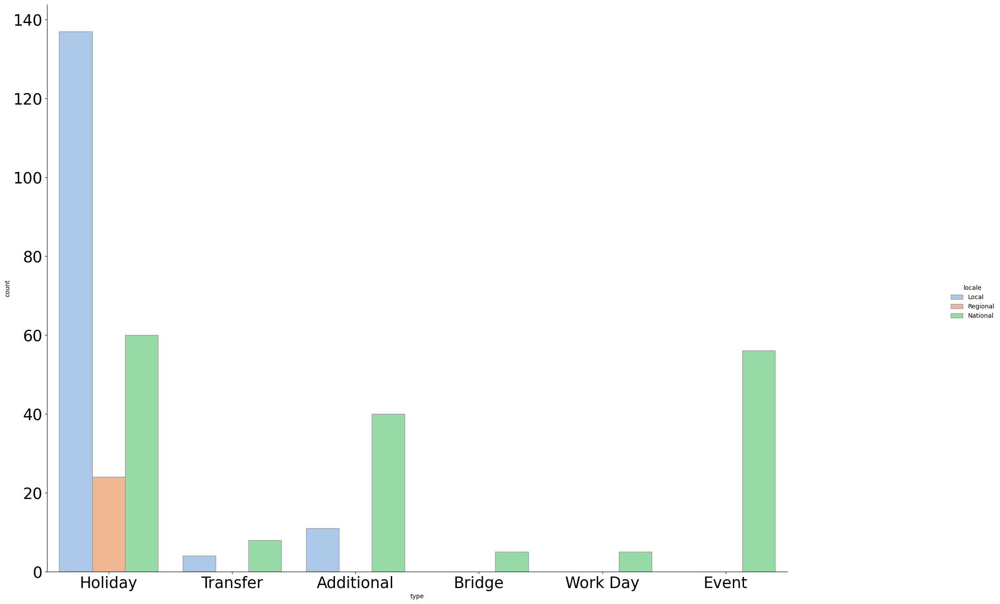

In [119]:
sns.catplot(x="type", hue="locale", kind="count", palette="pastel", edgecolor=".6", data=holidays_events)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)

plt.gcf().set_size_inches(25, 15)

In [212]:
train_fa_tr_st.head()
# city와 state 컬럼 삭제
train_fa_tr_st.drop(columns=["city", "state"], inplace=True)

KeyError: "['city', 'state'] not found in axis"

In [215]:
train_fa_tr_st.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85125 entries, 0 to 85124
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          85125 non-null  datetime64[ns]
 1   store_nbr                     85125 non-null  int64         
 2   weekday                       85125 non-null  int64         
 3   year                          85125 non-null  int32         
 4   month                         85125 non-null  int32         
 5   day                           85125 non-null  int32         
 6   BEVERAGES_onpromotion         85125 non-null  float64       
 7   BREAD/BAKERY_onpromotion      85125 non-null  float64       
 8   CLEANING_onpromotion          85125 non-null  float64       
 9   DAIRY_onpromotion             85125 non-null  float64       
 10  DELI_onpromotion              85125 non-null  float64       
 11  EGGS_onpromotion            

In [216]:
holidays_events.head()

,date,type_locale
0,2012-03-02,Holiday_Local
1,2012-04-01,Holiday_Regional
2,2012-04-12,Holiday_Local
3,2012-04-14,Holiday_Local
4,2012-04-21,Holiday_Local


In [ ]:
# type과 locale의 고유 쌍 추출
unique_pairs = holidays_events[['type', 'locale']].drop_duplicates().reset_index(drop=True)

# type_locale 형식으로 매칭
unique_pairs['type_locale'] = unique_pairs['type'] + "_" + unique_pairs['locale']

# 결과 출력
print("고유한 type과 locale의 쌍과 매칭된 값:\n", unique_pairs)

In [187]:
# 전체 데이터프레임에 매칭된 값을 추가
holidays_events = holidays_events.merge(unique_pairs, on=['type', 'locale'], how='left', suffixes=('', '_new'))

In [196]:
holidays_events.head()

,date,type_locale
0,2012-03-02,Holiday_Local
1,2012-04-01,Holiday_Regional
2,2012-04-12,Holiday_Local
3,2012-04-14,Holiday_Local
4,2012-04-21,Holiday_Local


In [ ]:
holidays_events.drop(columns=['type', 'locale', 'locale_name', 'description', 'transferred'], inplace=True)


In [217]:
train_fa_tr_st_ho = pd.merge(train_fa_tr_st, holidays_events, on='date', how='left')

# 결측값을 빈 문자열로 채우기 (필요에 따라 다른 값으로 채울 수 있음)
train_fa_tr_st_ho['type_locale'] = train_fa_tr_st_ho['type_locale'].fillna('')

# 결과 확인
train_fa_tr_st_ho.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88853 entries, 0 to 88852
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          88853 non-null  datetime64[ns]
 1   store_nbr                     88853 non-null  int64         
 2   weekday                       88853 non-null  int64         
 3   year                          88853 non-null  int32         
 4   month                         88853 non-null  int32         
 5   day                           88853 non-null  int32         
 6   BEVERAGES_onpromotion         88853 non-null  float64       
 7   BREAD/BAKERY_onpromotion      88853 non-null  float64       
 8   CLEANING_onpromotion          88853 non-null  float64       
 9   DAIRY_onpromotion             88853 non-null  float64       
 10  DELI_onpromotion              88853 non-null  float64       
 11  EGGS_onpromotion            

### Oil Preprocessing

In [122]:
oil = pd.read_csv("../data/oil.csv")
oil["date"] = pd.to_datetime(oil.date)


In [124]:
oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1704 entries, 0 to 1703
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   date                     1704 non-null   datetime64[ns]
 1   dcoilwtico               1175 non-null   float64       
 2   dcoilwtico_interpolated  1703 non-null   float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 40.1 KB


In [125]:
duplicated_dates = oil[oil.duplicated(subset=['date'], keep=False)]

# 중복되는 날짜 출력
print("중복되는 날짜:\n", duplicated_dates)

중복되는 날짜:
 Empty DataFrame
Columns: [date, dcoilwtico, dcoilwtico_interpolated]
Index: []


In [126]:
# Resample
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico.interpolate()
# Plot
p = oil.melt(id_vars=['date']+list(oil.keys()[5:]), var_name='Legend')
px.line(p.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Daily Oil Price" )

In [ ]:
oil.head()
oil.drop(columns=['dcoilwtico'], inplace=True)



In [223]:
# NaN 값을 뒤의 값으로 채우기
oil['dcoilwtico_interpolated'] = oil['dcoilwtico_interpolated'].fillna(method='bfill')
oil.head()

,date,dcoilwtico_interpolated
0,2013-01-01,93.14
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-05,93.15


In [224]:
train_fa_tr_st_ho_oil = pd.merge(train_fa_tr_st_ho, oil, on='date', how='left')

# 결과 확인
train_fa_tr_st_ho_oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88853 entries, 0 to 88852
Data columns (total 42 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          88853 non-null  datetime64[ns]
 1   store_nbr                     88853 non-null  int64         
 2   weekday                       88853 non-null  int64         
 3   year                          88853 non-null  int32         
 4   month                         88853 non-null  int32         
 5   day                           88853 non-null  int32         
 6   BEVERAGES_onpromotion         88853 non-null  float64       
 7   BREAD/BAKERY_onpromotion      88853 non-null  float64       
 8   CLEANING_onpromotion          88853 non-null  float64       
 9   DAIRY_onpromotion             88853 non-null  float64       
 10  DELI_onpromotion              88853 non-null  float64       
 11  EGGS_onpromotion            

In [225]:
train_fa_tr_st_ho_oil.to_csv('train_fa_tr_st_ho_oil.csv', index=False)

In [ ]:
train_new = pd.read_csv("./train_fa_tr_st_ho_oil.csv")

In [28]:
# X 데이터 프레임의 결측치 개수를 컬럼별로 확인
missing_values = train_new.isnull().sum()

# 결측치가 있는 컬럼과 그 수를 출력
print("결측치가 있는 컬럼과 그 수:")
print(missing_values[missing_values > 0])

# 결측치의 비율을 계산하여 출력
print("\n결측치의 비율 (%):")
print((missing_values / len(X)) * 100)

결측치가 있는 컬럼과 그 수:
transactions      118
type_locale     71213
dtype: int64

결측치의 비율 (%):
date                            0.00
store_nbr                       0.00
weekday                         0.00
year                            0.00
month                           0.00
day                             0.00
BEVERAGES_onpromotion           0.00
BREAD/BAKERY_onpromotion        0.00
CLEANING_onpromotion            0.00
DAIRY_onpromotion               0.00
DELI_onpromotion                0.00
EGGS_onpromotion                0.00
FROZEN FOODS_onpromotion        0.00
GROCERY I_onpromotion           0.00
HOME CARE_onpromotion           0.00
LIQUOR,WINE,BEER_onpromotion    0.00
MEATS_onpromotion               0.00
PERSONAL CARE_onpromotion       0.00
POULTRY_onpromotion             0.00
PREPARED FOODS_onpromotion      0.00
PRODUCE_onpromotion             0.00
BEVERAGES_sales                 0.00
BREAD/BAKERY_sales              0.00
CLEANING_sales                  0.00
DAIRY_sales             

In [29]:
# 데이터 확인
print("transactions 데이터 타입:", train_new['transactions'].dtype)
print("월별 평균 전 결측치 수:", train_new['transactions'].isnull().sum())

# 월별 transactions 평균 계산
monthly_avg_transactions = train_new.groupby('month')['transactions'].transform('mean')

# 평균값이 NaN인 경우 확인
if monthly_avg_transactions.isnull().any():
    print("경고: 일부 월에서 평균 transactions 값이 NaN입니다.")
    # 예: 전체 데이터의 평균으로 NaN 평균 대체
    overall_mean = train_new['transactions'].mean()
    monthly_avg_transactions.fillna(overall_mean, inplace=True)

# 결측치 채우기
train_new['transactions'].fillna(monthly_avg_transactions, inplace=True)

# 결측치 채우기 후 확인
print("결측치 채운 후 남은 결측치 수:", train_new['transactions'].isnull().sum())


transactions 데이터 타입: float64
월별 평균 전 결측치 수: 118
결측치 채운 후 남은 결측치 수: 0


In [31]:
# 결측치를 'Unknown'으로 대체
train_new['type_locale'].fillna('Unknown', inplace=True)

In [32]:
# X 데이터 프레임의 결측치 개수를 컬럼별로 확인
missing_values = train_new.isnull().sum()

# 결측치가 있는 컬럼과 그 수를 출력
print("결측치가 있는 컬럼과 그 수:")
print(missing_values[missing_values > 0])

# 결측치의 비율을 계산하여 출력
print("\n결측치의 비율 (%):")
print((missing_values / len(X)) * 100)

결측치가 있는 컬럼과 그 수:
Series([], dtype: int64)

결측치의 비율 (%):
date                           0.00
store_nbr                      0.00
weekday                        0.00
year                           0.00
month                          0.00
day                            0.00
BEVERAGES_onpromotion          0.00
BREAD/BAKERY_onpromotion       0.00
CLEANING_onpromotion           0.00
DAIRY_onpromotion              0.00
DELI_onpromotion               0.00
EGGS_onpromotion               0.00
FROZEN FOODS_onpromotion       0.00
GROCERY I_onpromotion          0.00
HOME CARE_onpromotion          0.00
LIQUOR,WINE,BEER_onpromotion   0.00
MEATS_onpromotion              0.00
PERSONAL CARE_onpromotion      0.00
POULTRY_onpromotion            0.00
PREPARED FOODS_onpromotion     0.00
PRODUCE_onpromotion            0.00
BEVERAGES_sales                0.00
BREAD/BAKERY_sales             0.00
CLEANING_sales                 0.00
DAIRY_sales                    0.00
DELI_sales                     0.00
EGGS_sal

In [33]:
train_new.to_csv('train_new.csv', index=False)

# Feature Engineering

## Feature Importance

In [34]:
train_new = pd.read_csv("./train_new.csv")

In [36]:
train_new.head()

,date,store_nbr,weekday,year,month,day,BEVERAGES_onpromotion,BREAD/BAKERY_onpromotion,CLEANING_onpromotion,DAIRY_onpromotion,DELI_onpromotion,EGGS_onpromotion,FROZEN FOODS_onpromotion,GROCERY I_onpromotion,HOME CARE_onpromotion,"LIQUOR,WINE,BEER_onpromotion",MEATS_onpromotion,PERSONAL CARE_onpromotion,POULTRY_onpromotion,PREPARED FOODS_onpromotion,PRODUCE_onpromotion,BEVERAGES_sales,BREAD/BAKERY_sales,CLEANING_sales,DAIRY_sales,DELI_sales,EGGS_sales,FROZEN FOODS_sales,GROCERY I_sales,HOME CARE_sales,"LIQUOR,WINE,BEER_sales",MEATS_sales,PERSONAL CARE_sales,POULTRY_sales,PREPARED FOODS_sales,PRODUCE_sales,_sales,transactions,store_type,store_cluster,type_locale,dcoilwtico_interpolated
0,2013-01-01,25,2,2013,1,1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,810.00,180.59,186.00,143.00,71.09,46.00,29.65,700.00,0.00,105.00,110.80,25.00,42.64,37.85,0.00,2487.62,770.00,D,1,Holiday_National,93.14
1,2013-01-02,1,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1091.00,470.65,1060.00,579.00,164.07,246.00,131.00,2652.00,0.00,67.00,369.10,194.00,247.30,47.00,0.00,7318.12,2111.00,D,13,Unknown,93.14
2,2013-01-02,2,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1481.00,523.88,1432.00,651.00,303.88,307.00,111.10,3870.00,0.00,29.00,655.63,333.00,342.51,127.36,0.00,10167.35,2358.00,D,13,Unknown,93.14
3,2013-01-02,3,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4486.00,1361.64,3101.00,1606.00,600.27,814.00,490.39,8463.00,0.00,122.00,945.64,623.00,681.35,428.00,0.00,23722.28,3487.00,D,8,Unknown,93.14
4,2013-01-02,4,3,2013,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1545.00,422.54,1358.00,589.00,268.34,273.00,146.13,4087.00,0.00,27.00,494.20,387.00,385.81,109.06,0.00,10092.09,1922.00,D,9,Unknown,93.14


In [37]:
# 이동 평균 및 이동 표준 편차 계산
train_new['Rolling_Std_Sales_3d'] = train_new['_sales'].rolling(window=3, min_periods=1).std()
train_new['Rolling_Mean_Sales_7d'] = train_new['_sales'].rolling(window=7, min_periods=1).mean()
train_new['Rolling_Std_Sales_7d'] = train_new['_sales'].rolling(window=7, min_periods=1).std()
train_new['Rolling_Mean_Sales_14d'] = train_new['_sales'].rolling(window=14, min_periods=1).mean()
train_new['Rolling_Std_Sales_14d'] = train_new['_sales'].rolling(window=14, min_periods=1).std()

# 결측치를 다음 값으로 채우기
train_new['Rolling_Std_Sales_3d'].fillna(method='bfill', inplace=True)
train_new['Rolling_Mean_Sales_7d'].fillna(method='bfill', inplace=True)
train_new['Rolling_Std_Sales_7d'].fillna(method='bfill', inplace=True)
train_new['Rolling_Mean_Sales_14d'].fillna(method='bfill', inplace=True)
train_new['Rolling_Std_Sales_14d'].fillna(method='bfill', inplace=True)

In [38]:
train_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88853 entries, 0 to 88852
Data columns (total 47 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   date                          88853 non-null  object 
 1   store_nbr                     88853 non-null  int64  
 2   weekday                       88853 non-null  int64  
 3   year                          88853 non-null  int64  
 4   month                         88853 non-null  int64  
 5   day                           88853 non-null  int64  
 6   BEVERAGES_onpromotion         88853 non-null  float64
 7   BREAD/BAKERY_onpromotion      88853 non-null  float64
 8   CLEANING_onpromotion          88853 non-null  float64
 9   DAIRY_onpromotion             88853 non-null  float64
 10  DELI_onpromotion              88853 non-null  float64
 11  EGGS_onpromotion              88853 non-null  float64
 12  FROZEN FOODS_onpromotion      88853 non-null  float64
 13  G

In [39]:
train_new.columns

Index(['date', 'store_nbr', 'weekday', 'year', 'month', 'day',
       'BEVERAGES_onpromotion', 'BREAD/BAKERY_onpromotion',
       'CLEANING_onpromotion', 'DAIRY_onpromotion', 'DELI_onpromotion',
       'EGGS_onpromotion', 'FROZEN FOODS_onpromotion', 'GROCERY I_onpromotion',
       'HOME CARE_onpromotion', 'LIQUOR,WINE,BEER_onpromotion',
       'MEATS_onpromotion', 'PERSONAL CARE_onpromotion', 'POULTRY_onpromotion',
       'PREPARED FOODS_onpromotion', 'PRODUCE_onpromotion', 'BEVERAGES_sales',
       'BREAD/BAKERY_sales', 'CLEANING_sales', 'DAIRY_sales', 'DELI_sales',
       'EGGS_sales', 'FROZEN FOODS_sales', 'GROCERY I_sales',
       'HOME CARE_sales', 'LIQUOR,WINE,BEER_sales', 'MEATS_sales',
       'PERSONAL CARE_sales', 'POULTRY_sales', 'PREPARED FOODS_sales',
       'PRODUCE_sales', '_sales', 'transactions', 'store_type',
       'store_cluster', 'type_locale', 'dcoilwtico_interpolated',
       'Rolling_Std_Sales_3d', 'Rolling_Mean_Sales_7d', 'Rolling_Std_Sales_7d',
       'Rolling_

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.preprocessing import StandardScaler

# 피처 선택을 위한 데이터 전처리
X = train_new.drop(['date', '_sales'], axis=1)
X = pd.get_dummies(X, columns=['store_nbr', 'store_type', 'store_cluster', 'type_locale', 'weekday', 'month'], drop_first=True)
y = train_new['_sales']

In [11]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88853 entries, 0 to 88852
Columns: 1645 entries, BEVERAGES_onpromotion to day_31
dtypes: bool(1609), float64(36)
memory usage: 160.7 MB


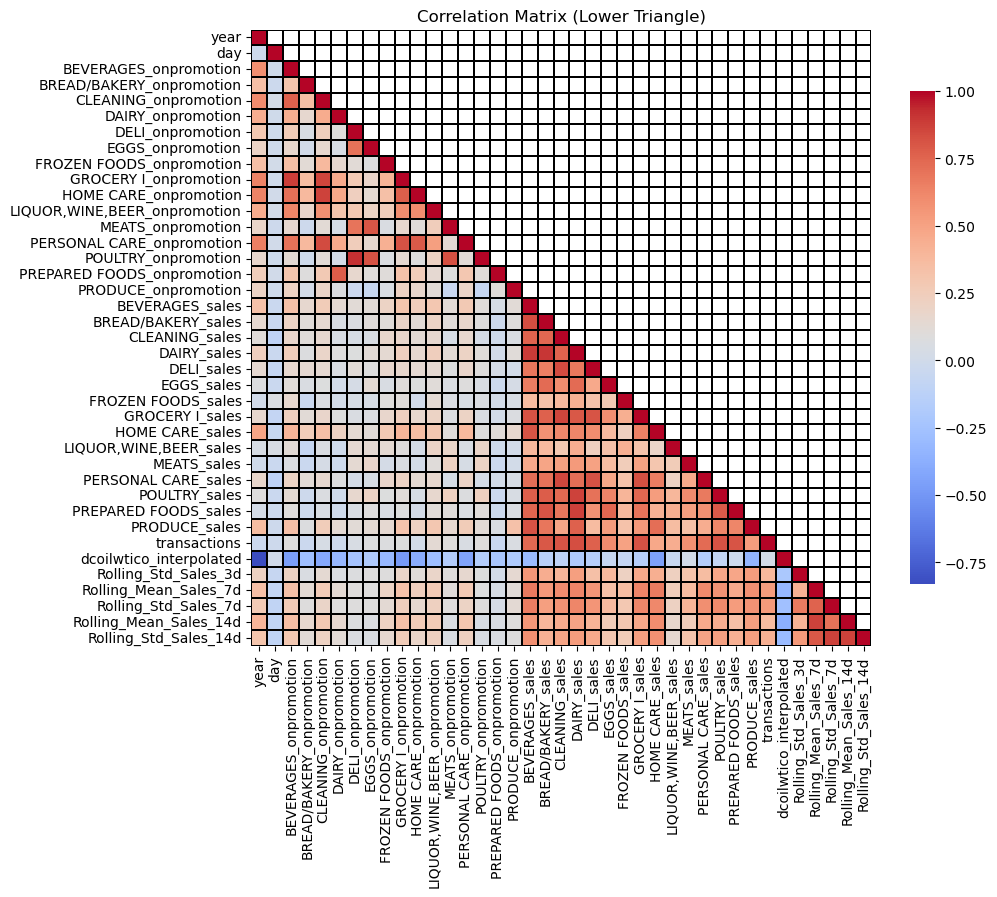

In [41]:
# train_new 데이터 프레임에서 숫자형 데이터만 선택
numeric_df = X.select_dtypes(include=[np.number])

# 상관관계 계수 계산
correlation_matrix = numeric_df.corr()

# 하단 삼각형 마스크 생성 (대각선 포함)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool), k=1)

# 히트맵 그리기
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=False, fmt=".2f", cmap='coolwarm',
            linewidths=0.1, linecolor='black', mask=mask, cbar_kws={'shrink': .8})
plt.title('Correlation Matrix (Lower Triangle)')
plt.show()

In [43]:
# 정규화
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 및 테스트 데이터 분리
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# 열 이름 저장
feature_names = X.columns

# 모델 학습
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# 피처 중요도 출력
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# 상위 15개 피처
for i in indices[:15]:
    print(f"{feature_names[i]}: {importances[i]:.4f}")

BEVERAGES_sales: 0.8686
GROCERY I_sales: 0.0647
DAIRY_sales: 0.0401
PRODUCE_sales: 0.0091
POULTRY_sales: 0.0028
MEATS_sales: 0.0020
Rolling_Std_Sales_3d: 0.0019
CLEANING_sales: 0.0016
transactions: 0.0013
FROZEN FOODS_sales: 0.0013
Rolling_Std_Sales_7d: 0.0012
Rolling_Std_Sales_14d: 0.0007
HOME CARE_sales: 0.0005
BREAD/BAKERY_sales: 0.0004
BREAD/BAKERY_onpromotion: 0.0003


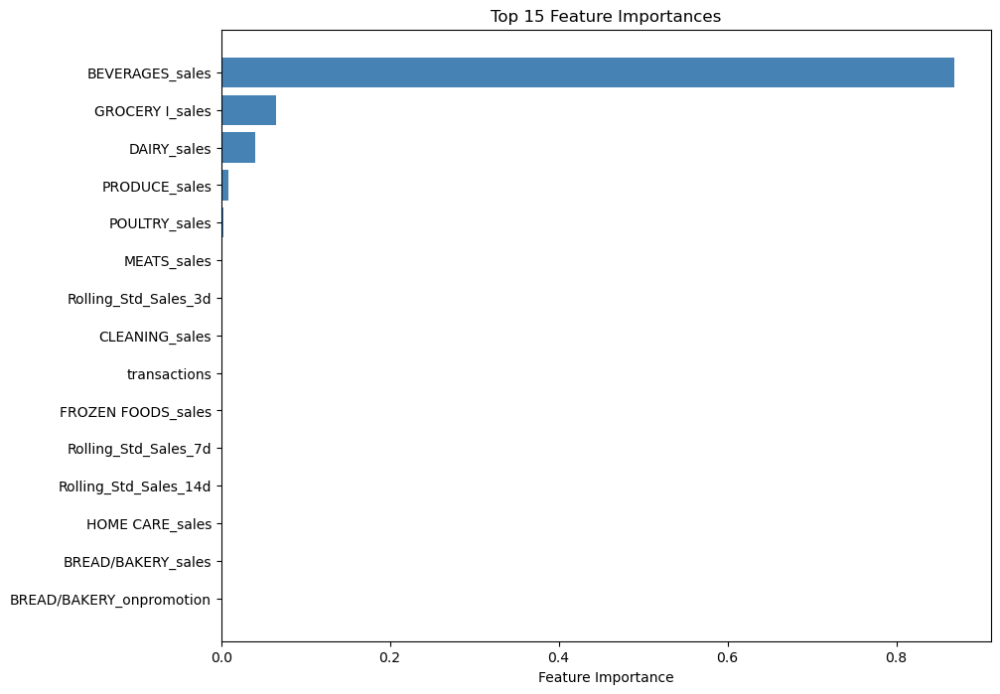

In [44]:
# 상위 15개 피처의 인덱스, 이름, 중요도 가져오기
top_indices = indices[:15]
top_features = [feature_names[i] for i in top_indices]
top_importances = [importances[i] for i in top_indices]

# 막대그래프로 시각화
plt.figure(figsize=(10, 8))
plt.barh(range(len(top_indices)), top_importances, color='steelblue', align='center')
plt.yticks(range(len(top_indices)), top_features)
plt.gca().invert_yaxis()  # 중요도가 높은 피처를 위로 올림
plt.xlabel('Feature Importance')
plt.title('Top 15 Feature Importances')
plt.show()

Lasso selected features: Index(['BEVERAGES_sales', 'BREAD/BAKERY_sales', 'CLEANING_sales',
       'DAIRY_sales', 'DELI_sales', 'EGGS_sales', 'FROZEN FOODS_sales',
       'GROCERY I_sales', 'HOME CARE_sales', 'LIQUOR,WINE,BEER_sales',
       'MEATS_sales', 'PERSONAL CARE_sales', 'POULTRY_sales',
       'PREPARED FOODS_sales', 'PRODUCE_sales', 'transactions'],
      dtype='object')


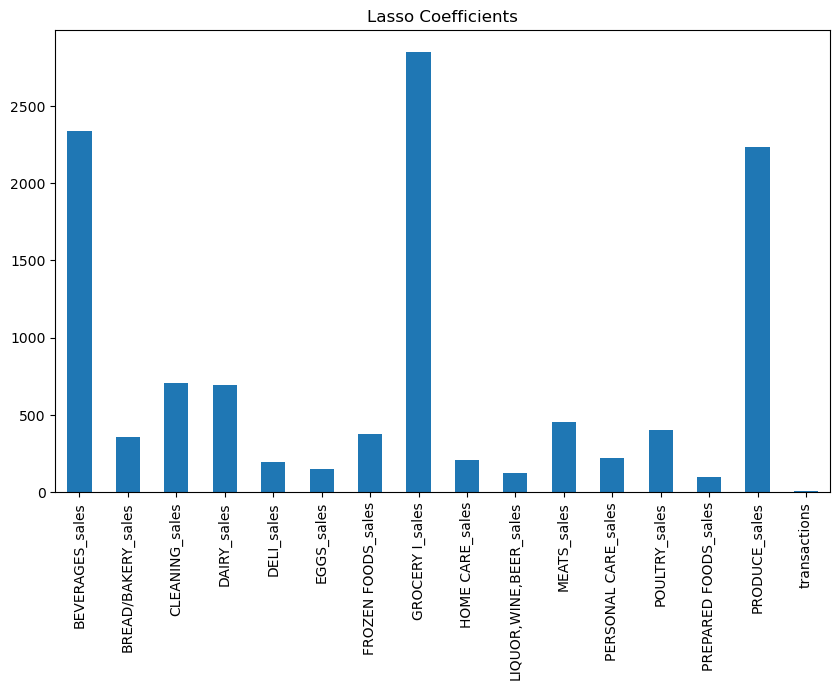

In [ ]:
# 3. Lasso Regression
lasso = LassoCV()
lasso.fit(X_scaled, y)
lasso_coef = pd.Series(lasso.coef_, index=X.columns)
print("Lasso selected features:", lasso_coef[lasso_coef != 0].index)

# Lasso coefficients visualization
plt.figure(figsize=(10, 6))
lasso_coef[lasso_coef != 0].plot(kind='bar')
plt.title('Lasso Coefficients')
plt.show()

## test code feature engineering

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.preprocessing import StandardScaler

train = pd.read_csv("../data/temp.csv")

# sales가 0인 데이터 제거 (예시 데이터에서는 모두 0이므로 실제 데이터를 사용할 때 유용)
train = train[train['sales'] != 0]

# 날짜 형식을 datetime으로 변환
train['date'] = pd.to_datetime(train['date'])

# 피처 선택을 위한 데이터 전처리
X = train.drop(['date', 'sales'], axis=1)
X = pd.get_dummies(X, columns=['family', 'city', 'state', 'type', 'day_of_week', 'year', 'month', 'day'], drop_first=True)
y = train['sales']

# 정규화
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 및 테스트 데이터 분리
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# 모델 학습
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# 피처 중요도 출력
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

for i in indices[:10]:  # 상위 10개 피처
    print(f"{X_train.columns[i]}: {importances[i]:.3f}")

family_GROCERY I: 0.320
transactions: 0.272
family_BEVERAGES: 0.125
family_PRODUCE: 0.050
onpromotion: 0.040
oil_price: 0.035
family_CLEANING: 0.023
store_nbr: 0.018
cluster: 0.014
family_DAIRY: 0.009


In [5]:
for i in indices[:20]:  # 상위 10개 피처
    print(f"{X_train.columns[i]}: {importances[i]:.3f}")

family_GROCERY I: 0.320
transactions: 0.272
family_BEVERAGES: 0.125
family_PRODUCE: 0.050
onpromotion: 0.040
oil_price: 0.035
family_CLEANING: 0.023
store_nbr: 0.018
cluster: 0.014
family_DAIRY: 0.009
day_of_week_Sunday: 0.007
year_2014: 0.005
year_2015: 0.005
type_D: 0.004
month_7: 0.004
day_2: 0.004
type_B: 0.004
family_BREAD/BAKERY: 0.003
month_3: 0.003
city_Guayaquil: 0.002
